In [1]:
import sys
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from IPython.core.display import display, HTML
import json
from zipfile import ZipFile

import warnings
warnings.filterwarnings('ignore')

In [2]:
file_name_chl = 'chl_oc4me.nc'

#file_name_chl = 'oo_2_subset_S3A_OL_1_EFR____20200628T092816_20200628T093116_20200629T153142_0179_060_036_2160_MAR_O_NT_002.nc'

In [3]:
OLCI_file = xr.open_dataset(os.path.join(file_name_chl))

FileNotFoundError: [Errno 2] No such file or directory: b'C:\\Users\\ozle_\\Desktop\\adriaclim\\pythonsss\\Nuova cartella\\SENTINEL\\chl_oc4me.nc'

In [4]:
OLCI_file

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4091)
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 ...
    CHL_OC4ME_err  (rows, columns) float32 ...
Attributes: (12/16)
    absolute_orbit_number:  22724
    ac_subsampling_factor:  64
    al_subsampling_factor:  1
    comment:                 
    contact:                ops@eumetsat.int
    creation_time:          2020-06-29T18:11:38Z
    ...                     ...
    references:             S3IPF PDS 004.3 - i2r2 - Product Data Format Spec...
    resolution:             [ 270 294 ]
    source:                 IPF-OL-2 06.13
    start_time:             2020-06-28T09:28:15.649581Z
    stop_time:              2020-06-28T09:31:15.614557Z
    title:                  OLCI Level 2 WATER Product, OC4Me Chlorophyll con...

In [5]:
CHL     = OLCI_file.CHL_OC4ME.data
OLCI_file.close()

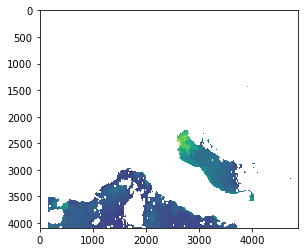

In [6]:
plt.imshow(CHL);

In [7]:
whos

Variable        Type        Data/Info
-------------------------------------
CHL             ndarray     4091x4865: 19902715 elems, type `float32`, 79610860 bytes (75.92283248901367 Mb)
HTML            type        <class 'IPython.core.display.HTML'>
OLCI_file       Dataset     <xarray.Dataset>\nDimensi<...> OC4Me Chlorophyll con...
ZipFile         type        <class 'zipfile.ZipFile'>
display         function    <function display at 0x000001DA0C854AF0>
file_name_chl   str         chl_oc4me.nc
glob            module      <module 'glob' from 'C:\\<...>anaconda3\\lib\\glob.py'>
json            module      <module 'json' from 'C:\\<...>\lib\\json\\__init__.py'>
np              module      <module 'numpy' from 'C:\<...>ges\\numpy\\__init__.py'>
os              module      <module 'os' from 'C:\\Us<...>\\anaconda3\\lib\\os.py'>
plt             module      <module 'matplotlib.pyplo<...>\\matplotlib\\pyplot.py'>
sys             module      <module 'sys' (built-in)>
warnings        module      <

In [5]:
row1=2150
row2=3000
col1=2400
col2=3500
grid_factor=1
CHL_subset = CHL[row1:row2:grid_factor, col1:col2:grid_factor]

NameError: name 'CHL' is not defined

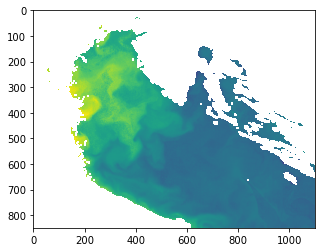

In [9]:
plt.imshow(CHL_subset);

In [10]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

land_resolution = '50m'
land_poly = cfeature.NaturalEarthFeature('physical', 'land', land_resolution,
                                        edgecolor='k',
                                        facecolor=cfeature.COLORS['land'])

In [4]:
file_name_geo = 'geo_coordinates.nc'
GEO_file      = xr.open_dataset(os.path.join(file_name_geo))
LAT           = GEO_file.variables['latitude'][:]
LON           = GEO_file.variables['longitude'][:]
LAT_subset    = LAT[row1:row2:grid_factor, col1:col2:grid_factor]
LON_subset    = LON[row1:row2:grid_factor, col1:col2:grid_factor]
GEO_file.close()

NameError: name 'row1' is not defined

In [12]:
GEO_file

<xarray.Dataset>
Dimensions:    (columns: 4865, rows: 4091)
Dimensions without coordinates: columns, rows
Data variables:
    altitude   (rows, columns) int16 ...
    latitude   (rows, columns) float64 ...
    longitude  (rows, columns) float64 ...
Attributes: (12/16)
    absolute_orbit_number:  22724
    ac_subsampling_factor:  64
    al_subsampling_factor:  1
    comment:                 
    contact:                ops@eumetsat.int
    creation_time:          2020-06-29T18:11:38Z
    ...                     ...
    references:             S3IPF PDS 004.3 - i2r2 - Product Data Format Spec...
    resolution:             [ 270 294 ]
    source:                 IPF-OL-2 06.13
    start_time:             2020-06-28T09:28:15.649581Z
    stop_time:              2020-06-28T09:31:15.614557Z
    title:                  OLCI Level 2 WATER Product, Geo Coordinates Data Set

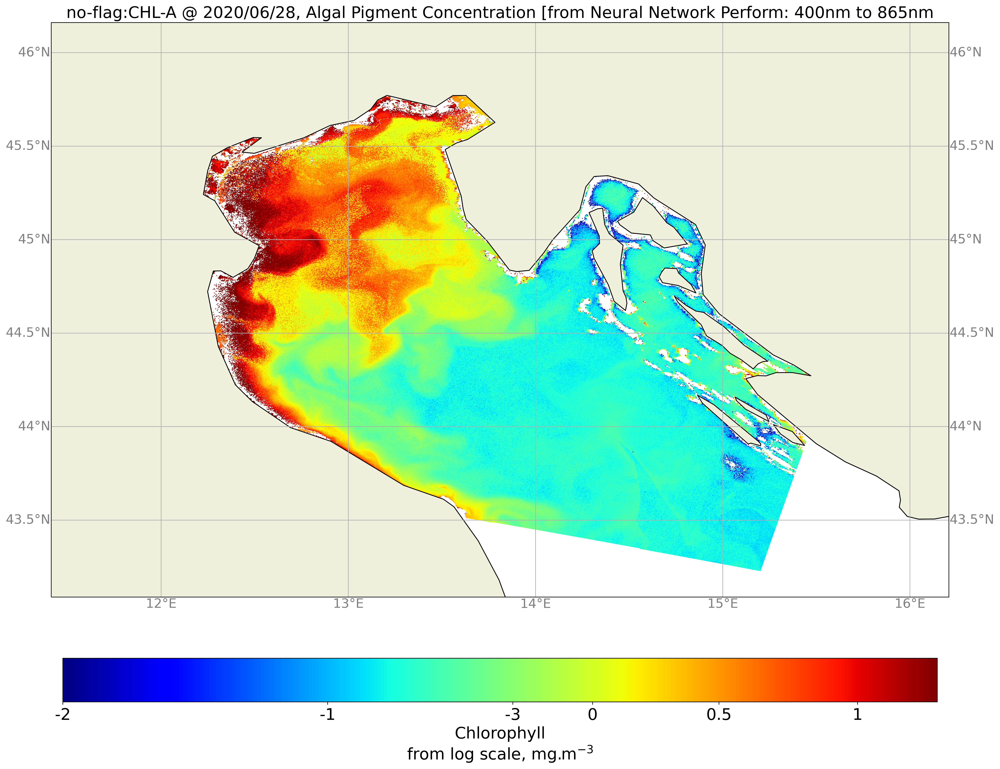

In [13]:
fig2 = plt.figure(figsize=(20, 20), dpi=400)
m = plt.axes(projection=ccrs.PlateCarree(central_longitude=0.0))
f1 = plt.pcolormesh(LON_subset,LAT_subset,np.ma.masked_invalid(CHL_subset), shading='flat', vmin=np.log10(0.01), vmax=np.log10(20), cmap=plt.cm.jet)  
m.coastlines(resolution=land_resolution, color='black', linewidth=1)
m.add_feature(land_poly)
g1 = m.gridlines(draw_labels = True)
g1.xlabels_top = False
g1.xlabel_style = {'size': 16, 'color': 'gray'}
g1.ylabel_style = {'size': 16, 'color': 'gray'}
cbar = plt.colorbar(f1, orientation="horizontal", fraction=0.05, pad=0.07, ticks=[np.log10(0.01), np.log10(0.1),np.log10(0.5), np.log10(1),np.log10(3),np.log10(10),np.log10(50)]) 
cbar.ax.set_xticklabels(['-2','-1','-3','0','0.5','1','1.7'], fontsize=20) 
cbar.set_label('Chlorophyll\nfrom log scale, mg.m$^{-3}$', fontsize=20)
plt.title('no-flag:CHL-A @ 2020/06/28, Algal Pigment Concentration [from Neural Network Perform: 400nm to 865nm', fontsize=20);
plt.show()

In [14]:
fig2.savefig('__no_flag_OLCI_CHL_A_.png', bbox_inches='tight')

In [15]:
def flag_data_fast(flags_we_want, flag_names, flag_values, flag_data, flag_type='WQSF'):
    flag_bits = np.uint64()
    if flag_type == 'SST':
        flag_bits = np.uint8()
    elif flag_type == 'WQSF_lsb':
        flag_bits = np.uint32()
    
    for flag in flags_we_want:
        try:
            flag_bits = flag_bits | flag_values[flag_names.index(flag)]
        except:
            print(flag + " not present")
    
    return (flag_data & flag_bits) > 0

In [16]:
#flags_we_want = ['CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN', 'INVALID', 'COSMETIC', 'SATURATED', 'SUSPECT',
#                 'HISOLZEN', 'HIGHGLINT', 'SNOW_ICE', 'AC_FAIL', 'WHITECAPS', 'ANNOT_ABSO_D', 'ANNOT_MIXR1',
#                 'ANNOT_TAU06']
flags_we_want = ['CLOUD', 'CLOUD_AMBIGUOUS', 'CLOUD_MARGIN', 'INVALID']

file_name_flags = 'wqsf.nc'
FLAG_file = xr.open_dataset(os.path.join(file_name_flags))
# get all the flag names
flag_names = FLAG_file['WQSF'].flag_meanings.split(' ')
# get all the flag bit values
flag_vals = FLAG_file['WQSF'].flag_masks
# get the flag field itself
FLAGS = FLAG_file.variables['WQSF'].data
FLAG_file.close()

# make the flag mask using the function we defined above "flag_data_fast"
flag_mask = flag_data_fast(flags_we_want, flag_names, flag_vals, FLAGS, flag_type='WQSF')
flag_mask = flag_mask.astype(float)
flag_mask[flag_mask == 0.0] = np.nan

# subset the flag mask
FLAG_subset = flag_mask[row1:row2:grid_factor, col1:col2:grid_factor]

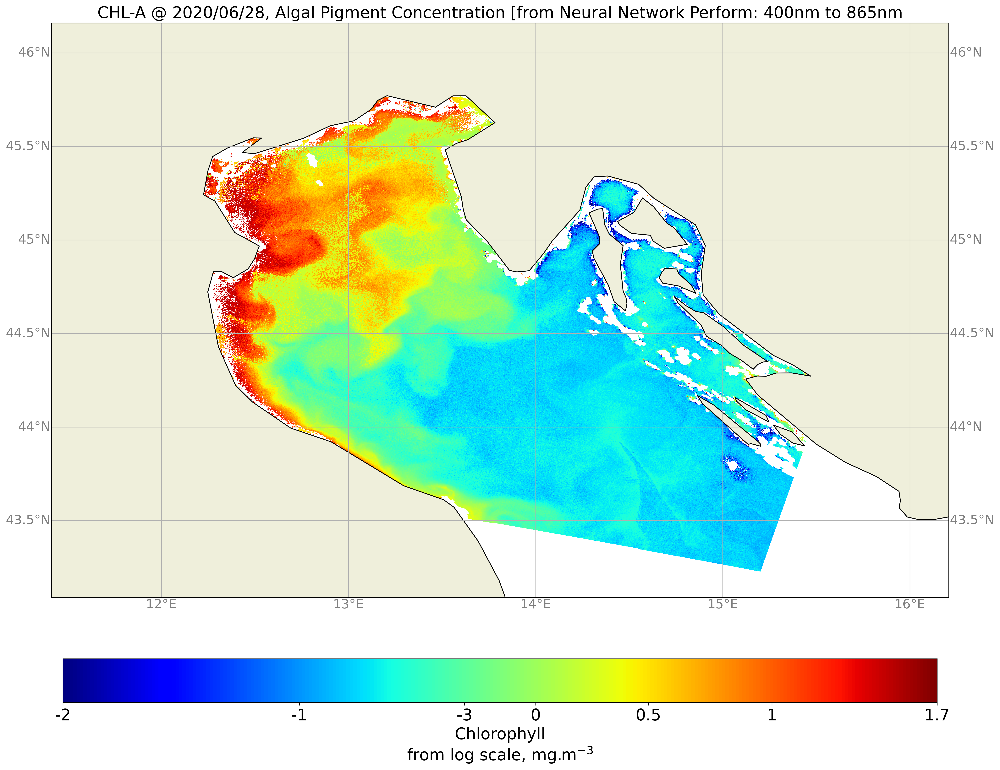

In [17]:
CHL_subset[np.isfinite(FLAG_subset)] = np.nan

fig3 = plt.figure(figsize=(20, 20), dpi=300)
m = plt.axes(projection=ccrs.PlateCarree(central_longitude=0.0))
f1 = plt.pcolormesh(LON_subset,LAT_subset,np.ma.masked_invalid(CHL_subset), shading='flat', vmin=np.log10(0.01), vmax=np.log10(50), cmap=plt.cm.jet)  
m.coastlines(resolution=land_resolution, color='black', linewidth=1)
m.add_feature(land_poly)
g1 = m.gridlines(draw_labels = True)
g1.xlabels_top = False
g1.xlabel_style = {'size': 16, 'color': 'gray'}
g1.ylabel_style = {'size': 16, 'color': 'gray'}
cbar = plt.colorbar(f1, orientation="horizontal", fraction=0.05, pad=0.07, ticks=[np.log10(0.01), np.log10(0.1),np.log10(0.5), np.log10(1),np.log10(3),np.log10(10),np.log10(50)]) 
cbar.ax.set_xticklabels(['-2','-1','-3','0','0.5','1','1.7'], fontsize=20) 
cbar.set_label('Chlorophyll\nfrom log scale, mg.m$^{-3}$', fontsize=20)
plt.title('CHL-A @ 2020/06/28, Algal Pigment Concentration [from Neural Network Perform: 400nm to 865nm', fontsize=20);
plt.show()

In [18]:
fig3.savefig('__OLCI_CHL_A_.png', bbox_inches='tight')